# Sheet 2: Solution

In [1]:
options(jupyter.plot_mimetypes = 'image/png',repr.plot.width=4,repr.plot.height=4, # this is just to render graphics as png and not as svg, and to adjust the default size
       jupyter.plot_mimetypes = c('text/plain', 'image/png', 'image/svg+xml', 'application/pdf')) 

SyntaxError: keyword can't be an expression (<ipython-input-1-869277faa256>, line 1)

## Exercise 1: knn and regression compared

Note: In the exercise, the notatin is wrong: Data matrices and random variables are denoted with the same symbol, e.g. $X$. Next time, change this!

For simplicity we assume that $y$ and $x$ are scalars, $X \subset \mathbb R, Y \subset \mathbb R, $. Then we can write $Y^T = (y_1,\ldots,y_n)$ and $X^T = \begin{pmatrix}
  1 & \ldots & 1 \\
  x_1 & \ldots & x_n 
 \end{pmatrix}$ 

<b>Part 1. 
+ Linear Regression.</b> Using (2.2) and (2.6) from Hastie et al., we have $\hat \beta = (X^T X)^{-1} X^T Y$ and then set

$$ f_S(x_0) = [x_0 1] \hat \beta = [x_0 1] (X^T X)^{-1} X^T Y.$$

Then, $\omega_i(x_0, X) = [x_0 1] (X^T X)^{-1} \begin{bmatrix} 1 \\ x_i \end{bmatrix},$ for each $i: 1\leq i \leq n.$

 We can also write more explicitly, 
    $X^T X = 
    \begin{pmatrix}
    n & \sum x_i \\
    \sum x_i & \sum x_i^2 
    \end{pmatrix},$
    
 which has determinant $(n-1) \sum_i x_i^2 - 2n \sum_{i<j} x_i x_j.$ This allows us to calculate $(X^T X)^{-1}$ and $\omega_i(x_0, X)$ even more explicitly. 
    
+ <b>k-NN.</b>  The weights are equal $\omega_i(x_0, X) = \frac 1k$ if $x_i$ is one of the nearest
$k$ points and 0 otherwise.

   

<b>Part 2. </b> By a standard decomposition,
$$
E_{Y|X} ( (f(x_0) - f_S(x_0))^2 )= f(x_0)^2 - 2 f(x_0) E_{Y|X} (f_S(x_0)) + E_{Y|X} ((f_S(x_0))^2) \\
= (f(x_0) - E_{Y|X} (f_S(x_0)))^2 + E_{Y|X} ((f_S(x_0))^2) - (E_{Y|X} (f_S(x_0)))^2 \\
= (f(x_0) - E_{Y|X} (f_S(x_0)))^2 + \mathtt{Var}_{Y|X} (f_S(x_0))
$$

The
first term on the right hand side is the squared conditional bias, whereas the second term is the conditional variance. Because of the conditioning,
we have, for linear estimators,
$$\mathtt{Var}_{Y|X} (f_S(x_0)) = \sigma^2 \sum_i \omega_i^2 (x_0, X)$$

and

$$ \mathtt{Bias}_{Y|X}^2 (f_S(x_0)) = \left(f(x_0)  - \sum_i \omega_i (x_0, X) f(x_i)  \right)^2$$ 

<b>Part 3. </b> The calculation goes into the same way as in Part 2, except that both $X$ and $Y$ vary.

$$
E_{X,Y} ( (f(x_0) - f_S(x_0))^2 )= f(x_0)^2 - 2 f(x_0) E_{X,Y} (f_S(x_0)) + E_{X,Y} (f_S(x_0))^2 \\
= (f(x_0) - E_{X,Y} (f_S(x_0)))^2 + E_{X,Y} (f_S(x_0))^2 - (E_{X,Y} (f_S(x_0)))^2 \\
= \mathtt{Bias}^2 (f_s(x_0)) + \mathtt{Var} (f_S(x_0)).
$$

The
first term on the right hand side is the squared unconditional bias, whereas the second term is the unconditional variance of $f_S.$ For linear estimators of $f$ by the conditional variance identity

$$
\mathtt{Var} (Y) = E \mathtt{Var}(Y|X) + \mathtt{Var} E(Y|X),
$$

we have

$$
\mathtt{Var}_{X,Y} (f_S (x_0)) = E_X \mathtt{Var}_{Y|X} (f_S(x_0)) + \mathtt{Var}_X E_{Y|X} (f_S(x_0)) = \sigma^2 \sum_i E(\omega_i^2 (x_0, X)) + \mathtt{Var} \left( \sum_i \omega_i (x_0, X) f(x_i) \right).
$$

For the bias:

$$
 \mathtt{Bias}^2_{X,Y} (f_s(x_0)) = \left(f(x_0)  - \sum_i E(\omega_i (x_0, X) f(x_i) ) \right)^2.$$ 


<b> Additional discussion: </b> By the property of expectation,
$$
E_{X,Y} (f(x_0) - f_S(x_0))^2 = E_X \left[ E_{Y|X} (f(x_0) - f_S(x_0))^2  \right] = E_X \left[\mathtt{Var}_{Y|X} (f_S(x_0)) \right] + E_X \left[\mathtt{Bias}_{Y|X}^2 (f_S(x_0)) \right].$$

But on the other hand, by the decomposition derived above in
conjunction with the conditional variance identity we have,
$$
E_{X,Y} (f(x_0) - f_S(x_0))^2 = E_X \left[\mathtt{Var}_{Y|X} (f_S(x_0)) \right] + \mathtt{Var}_X \left[E_{Y|X} (f_S(x_0)) \right] + \mathtt{Bias}_{Y,X}^2 (f_S(x_0)).
$$

Therefore the average conditional squared bias is larger than the unconditional squared bias; the difference is the variance of the conditional
expectation of the estimator.

## Exercise 2: Bias-variance tradeoff for k nearest neighbor for iris data set

We study the bias-variance tradeoff for the k nearest neighbor algorithm, although this is a little bit of a paradoxical case. It might seem that the "simplest" and least complex model is the one where k is 1. This reasoning is based on the conceit that having more neighbors be involved in calculating the value of a point results in greater complexity. From a computational standpoint this might be true, but it is more accurate to think of complexity from a model standpoint. The greater the variability of the resulting model, the greater its complexity. Averaging over more neighbors yields a smaller variance and is less adaptive to the details of the training set. Averaging over less neighbors yields a higher variance ...

In [2]:
library(ggplot2); library(class)

In [3]:
head(iris,8)

Sepal.Length,Sepal.Width,Petal.Length,Petal.Width,Species
5.1,3.5,1.4,0.2,setosa
4.9,3.0,1.4,0.2,setosa
4.7,3.2,1.3,0.2,setosa
4.6,3.1,1.5,0.2,setosa
5.0,3.6,1.4,0.2,setosa
5.4,3.9,1.7,0.4,setosa
4.6,3.4,1.4,0.3,setosa
5.0,3.4,1.5,0.2,setosa


Divide the data set into train and test as done on exercise sheet 1.

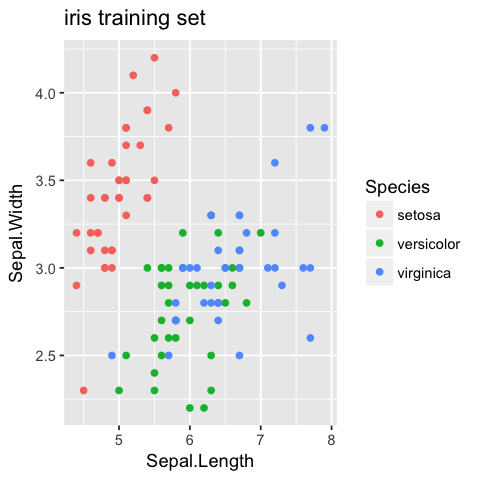

In [4]:
set.seed(1234)
ind <- sample(2, nrow(iris), replace=TRUE, prob=c(0.67, 0.33))
iris.train <- iris[ind==1, 1:2]
iris.trainLabels <- iris[ind==1, 5]
ggplot(data.frame(iris.train,Species=iris.trainLabels), aes(Sepal.Length, Sepal.Width, colour=Species)) + 
ggtitle("iris training set") + geom_point()

Define a training set (a grid) that allows to inspect the decision boundary.

In [5]:
px1 <- seq(from = 4, to = 8, by = 0.1)
px2 <- seq(from = 2, to = 4.5, by = 0.05)
iris.grid = expand.grid(Sepal.Length=px1, Sepal.Width=px2)
# this was our test set on sheet 1
iris.test <- iris[ind==2, 1:2] 
iris.testLabels <- iris[ind==2, 5]

Train the k nearest neighbor algorithm.

In [6]:
library(class)
iris.predGridLabels <- knn(train=iris.train, test=iris.grid, cl=iris.trainLabels, k=1, prob=TRUE)

Visualize the decision boundary to reveal the missclassification. Obviously, due to the "bad" clustering of the data, our missclassification rate for the train and test set is quite high. Remember that the data clustered much better when using the width and length of the petal instead of the sepal (as petal width and length are more distinctive features). Had we taken the latter to train the algorithm, our result would be much better.

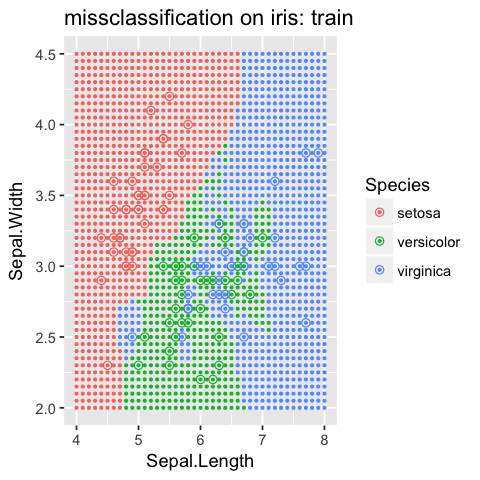

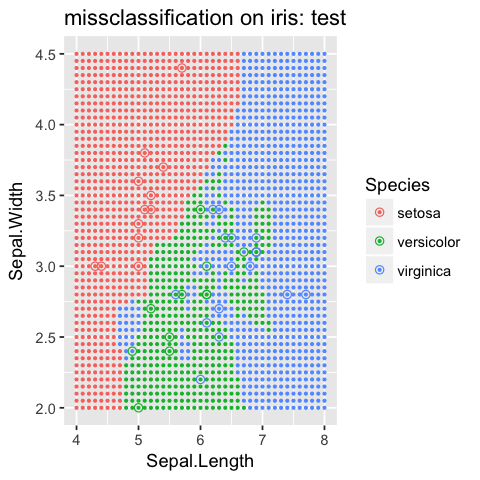

In [27]:
ggplot() +
ggtitle("missclassification on iris: train") + 
geom_point(mapping=aes(Sepal.Length, Sepal.Width, colour = Species),
           data=data.frame(iris.train, Species = iris.trainLabels),size =2,fill = NA,shape = 21) +
geom_point(mapping=aes(Sepal.Length, Sepal.Width, colour = Species),
           data.frame(iris.grid, Species = iris.predGridLabels),size=0.5)

ggplot() +
ggtitle("missclassification on iris: test") +
geom_point(mapping=aes(Sepal.Length, Sepal.Width, colour = Species),
           data=data.frame(iris.test, Species = iris.testLabels),size = 2,fill = NA,shape = 21) +
geom_point(mapping=aes(Sepal.Length, Sepal.Width, colour = Species),
           data.frame(iris.grid, Species = iris.predGridLabels),size=0.5)


Playing around with values of k, decreasing it to a low value makes us realize that the training error becomes very small. But this doesn't actually help us for the test error. The test error starts increasing again if we make k too small as the model starts overfitting. To shed more light on this, let us take a data set with just binary classification.

## Exercise 3: Bias-variance trade off for k nearest neighbor for mixture example

Let us install and load the R package "ElemStatLearn" associated with Hastie et al. (2009). Training and test data (xgrid) are defined as follows.

In [8]:
library(ElemStatLearn); library(class)
xtrain <- mixture.example$x
gtrain <- mixture.example$y
px1 <- mixture.example$px1
px2 <- mixture.example$px2
xgrid = expand.grid(x=px1, y=px2)

### (a) Contour plot of the decision boundary

Now call the knn classifier.

In [9]:
mod15 <- knn(xtrain, xgrid, gtrain, k=15, prob=TRUE)
prob <- attr(mod15, "prob")
# interpreting the vote ratio of the "0" class as negative
prob <- ifelse(mod15=="1", prob, -prob)
prob15 <- matrix(prob, length(px1), length(px2))

With this data, we can make a contour plot.

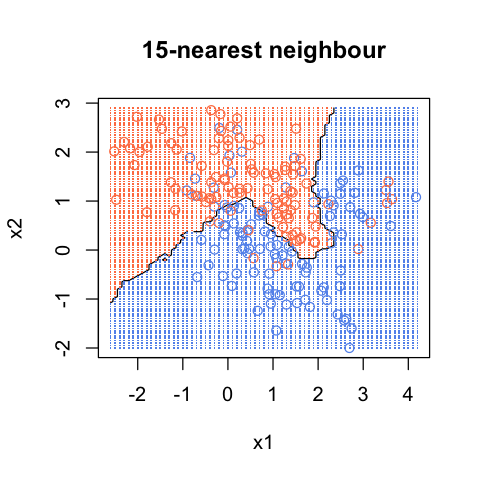

In [10]:
contour(px1, px2, prob15, levels=0, labels="", xlab="x1", ylab="x2", main=
        "15-nearest neighbour", axes=FALSE)
axis(1);axis(2)
points(xtrain, col=ifelse(gtrain==1, "coral", "cornflowerblue"))
points(xgrid, pch=".", cex=1.2, col=ifelse(prob15>0, "coral", "cornflowerblue"))
box()

Let's repeat this for a much smaller number of neighbors. k=2

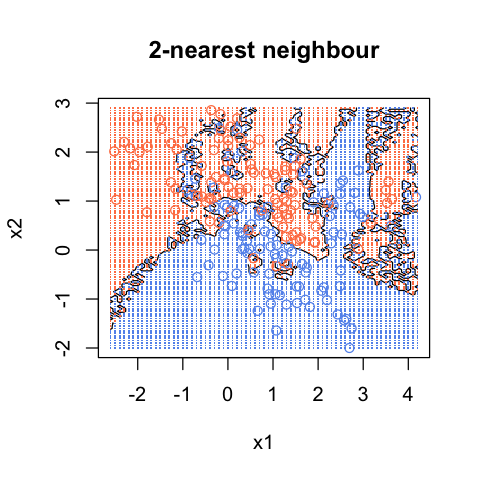

In [11]:
mod2 <- knn(xtrain, xgrid, gtrain, k=2, prob=TRUE)
prob <- attr(mod2, "prob")
prob <- ifelse(mod2 =="1", prob, -prob)
prob2 <- matrix(prob, length(px1), length(px2))
contour(px1, px2, prob2, levels=0, labels="", xlab="x1", ylab="x2", main=
        "2-nearest neighbour", axes=FALSE)
axis(1);axis(2)
points(xtrain, col=ifelse(gtrain==1, "coral", "cornflowerblue"))
points(xgrid, pch=".", cex=1.2, col=ifelse(prob2>0, "coral", "cornflowerblue"))
box()

Obviously, the classifier now fits the training data much better (we could obtain a zero misclassification rate by setting k=1). But the classification boundary is now very wiggly, it has a very complex and unnatural form.

You can find these pictures in Hastie et al. (2009) as Fig. 2.2 and Fig. 2.3.

### (b) Classification error

Let us first generate some new test data.

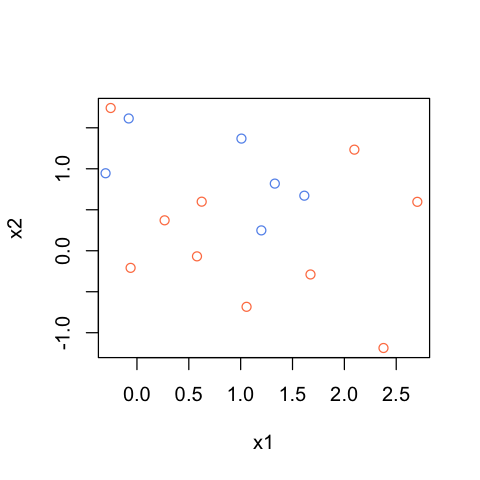

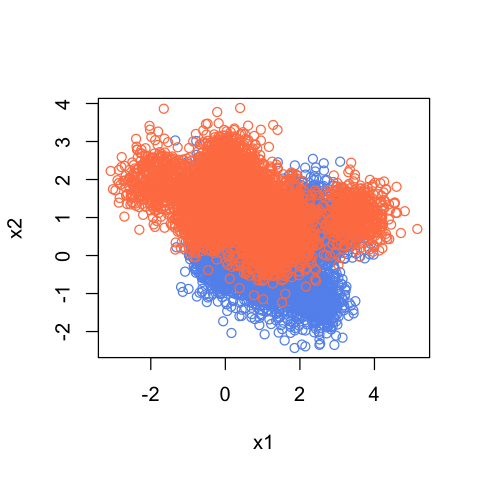

In [12]:
library(mvtnorm)
# this stores the means that are used to generate the data
# they were drawn from a bivariate Gaussian N((0,1)^T,I)
# the first ten means correspond to class 1 
# and the second ten means correspond to class 2
means <- mixture.example$means
plot(means[1:10,],col = "coral",xlab = "x1",ylab = "x2")
points(means[11:20,],col = "cornflowerblue")

# sample 5000 new observations from each class
# first sample the means
set.seed(123)
meansObserved <- c(sample(1:10, 5000, replace=TRUE),
                   sample(11:20, 5000, replace=TRUE))
# we get the vector of observations as follows
means <- means[meansObserved, ]
# generate 10000 observations by sampling from a multivariate Gaussian
# with diagonal covariance of 0.2 and means as sampled before
mix.test <- rmvnorm(10000, c(0,0), 0.2*diag(2)) + means
# the ground truth (class labels) can be obtained from the index (remember,
# the first 5000 were sampled from the means that belonged to class 0
# and the second from the means that belonged to class 1)
gtest <- c(rep(0, 5000), rep(1, 5000))
plot(mix.test,col = ifelse(gtest==1, "coral", "cornflowerblue"),xlab = "x1",ylab = "x2")

Now loop over different numbers of nearest neighbors. 

In [13]:
ks <- c(1,3,5,7,9,11,15,17,23,25,35,45,55,83,101,151)
# nearest neighbours to try
nks <- length(ks)
# init vectors for storing the percentage of missclassified cases
misclass.train <- numeric(length=nks)
misclass.test  <- numeric(length=nks)
names(misclass.train) <- names(misclass.test) <- ks
# do the loop
for (i in seq(along=ks)) {
    mod.train <- knn(xtrain,xtrain,gtrain,k=ks[i])
    mod.test  <- knn(xtrain,mix.test,gtrain,k=ks[i])
    misclass.train[i] <- 1 - sum(mod.train==factor(gtrain))/200
    misclass.test[i] <- 1 - sum(mod.test==factor(gtest))/10000
}

Output of the result

    misclass.train misclass.test
1            0.000        0.2935
3            0.130        0.2437
5            0.130        0.2266
7            0.145        0.2250
9            0.155        0.2283
11           0.185        0.2472
15           0.155        0.2480
17           0.175        0.2469
23           0.175        0.2485
25           0.170        0.2503
35           0.200        0.2647
45           0.210        0.2646
55           0.200        0.2781
83           0.265        0.2903
101          0.305        0.3041
151          0.305        0.3247


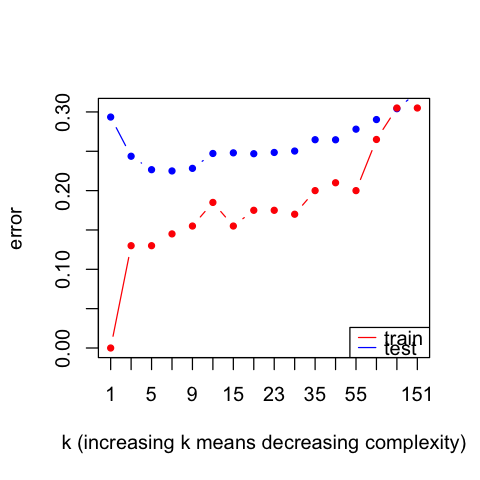

In [14]:
print(cbind(misclass.train, misclass.test))
plot(misclass.train,xlab="k (increasing k means decreasing complexity)",ylab="error",type="n",xaxt="n")
axis(1, 1:length(ks), as.character(ks))
lines(misclass.test,type="b",col='blue',pch=20)
lines(misclass.train,type="b",col='red',pch=20)
legend("bottomright",lty=1,col=c("red","blue"),legend = c("train ", "test "),text.width=2)

We see that the minimum for the test error is reached somewhere around k=10. This is the same data as shown in Fig. 2.4 from Hastie et al. (2009).

## Exercise 4: Compare knn with Bayes optimal classifier

The MAP reads

$$ \hat G(x) = \text{argmax}_g\,p(g|x,\mathcal{D}) $$

where $\mathcal{D}$ is the observed data. Obviously,

$$ p(g|x,\mathcal{D}) = \frac{p(x|g,\mathcal{D})p(g,\mathcal{D})}{p(x,\mathcal{D})}  $$

Therefore

$$ \text{argmax}_g\,p(g|x,\mathcal{D}) 
= \text{argmax}_g\,p(x|g,\mathcal{D})p(g,\mathcal{D})
= \text{argmax}_g\,p(x|g,\mathcal{D}),$$

where the last line holds as we assume that the data $\mathcal{D}$ is sampled with equal probability from both classes $g=A$ and $g=B$ (the data is unbiased with respect to $g$), and the same holds for any new observation.



### Exercise a)

Assume we only know that the data stem from Gaussians with unkown parameters $\theta=(\mu,\sigma^2)$. How can you evaluate the MAP?

$$p(x|g,\mathcal{D}) = \int d\theta\,p(x,\theta|g,\mathcal{D}) = \int d\theta\, p(x|\theta,g,\mathcal{D}) p(\theta|g,\mathcal{D}) = \int d\theta_g\, p(x|\theta_g,\mathcal{D}) p(\theta_g|\mathcal{D})$$ 

where $d\theta=d\mu d\sigma^2$ is the integration measure, and by defining $\theta_g$ we accounted for conditioning on $g$. As we don't have any additional information $\mathcal{D}$

$$ \int d\theta_g\, p(x|\theta_g,\mathcal{D}) p(\theta_g|\mathcal{D}) = \int d\theta_g\, p(x|\theta_g) p(\theta_g) $$

The last expression can be computed using $p(x|\theta_g) = \mathcal{N}(x|\theta_g)$ and $p(\theta_g)=\mathcal{N}(\theta_g|a_g,Id)$ where $a_g=(1,0)^T$ for $g=A$ and $a_g=(0,1)^T$ for $g=B$ and $Id$ denotes the identity matrix.

### Exercise b)

Now assume you know the parameters $\theta_g$ of the Gaussians from which new observations $x$ are drawn. How does your MAP estimate then look like?

In the above framework, you can express this by writing $\mathcal{D} = M_g$, where this denotes the set/event (using the same symbol $M_g$ for set and event): "Observations from class $g$ are drawn from a *mixture of Gaussians* with parameters $\theta \in M_g$. Each Gaussian of this mixture is chosen with equal probability $p=\frac{1}{|M_g|}$". In our application, there are 10 Gaussians for each class ($|M_g|=10$).

Let us once again evaluate the above

$$p(x|g,\mathcal{D}) = \int d\theta_g\, p(x|\theta_g,\mathcal{D}) p(\theta_g|\mathcal{D}) =  \int d\theta_g\, p(x|\theta_g,M_g) p(\theta_g|M_g)$$

The prior can now be given as $p(\theta_g|M_g) = \frac{1}{|M_g|} \sum_{\theta \in M_g} \delta(\theta-\theta_g)$, which expresses the fact the observation is drawn from Gaussians parametrized by $\theta \in M_g$ with equal probability. Using this to evaluate the above integral we restrict the values of $\theta_g$ to those values $\theta$ that are part of $M_g$, and we can drop the additional conditioning on $M_g$ from $p(x|\theta_g,M_g)$. Therefore

$$p(x|g,\mathcal{D}) \propto \sum_{\theta \in M_g} p(x|\theta)$$

We can easily compute and plot the MAP as follows.

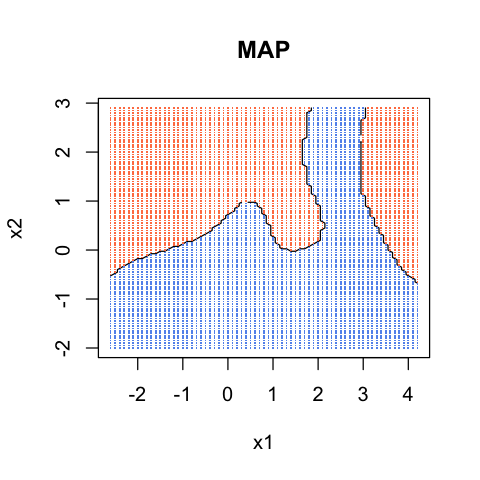

In [15]:
# load library for multivariate gaussians
library(ElemStatLearn); library(mvtnorm)
# this stores the means that were used to generate the data
# they were drawn from a bivariate Gaussian N((0,1)^T,I)
# the first ten means correspond to class 1 and the second ten means correspond 
# to class 2
means <- mixture.example$means[,]
px1 <- mixture.example$px1
px2 <- mixture.example$px2
# px1 <- seq(-2,3,0.8)
# px2 <- seq(-2,3,0.8)
# px1 <- seq(0,1,1)
# px2 <- seq(0,1,1)
xgrid = expand.grid(x=px1, y=px2)
dec <- numeric(length=length(xgrid[,1]))
# do the loop over new observations
for (ix in seq_along(xgrid[,1])){
    # print(xgrid[ix,])
    pA = 0
    pB = 0
    for (g in c(0,1)) {
        p <- 0
        # do the sum over \theta \in M_g    
        for (im in if(g==0) 1:10 else 11:20) {
            # print(means[im,])
            # print(0.2*diag(2))
            # print(xgrid[ix,])
            # P(x|\theta)
            p1 <- dmvnorm(xgrid[ix,],means[im,],0.2*diag(2))
            p <- p + p1
        }
        if(g==0) pA<-p else pB<-p
    }
    dec[ix] = if(pB>pA) 1 else 0
    # print(c(dec[ix],pA,pB))                
}
dec <- matrix(dec, length(px1), length(px2))
contour(px1, px2, dec, levels=0.5, labels="", xlab="x1", ylab="x2", main=
        "MAP", axes=FALSE)
axis(1);axis(2)
# here, we don't plot the training data, as this training data was not used to compute the MAP            
# points(xtrain, col=ifelse(gtrain==1, "coral", "cornflowerblue"))
points(xgrid, pch=".", cex=1.2, col=ifelse(dec>0.5, "coral", "cornflowerblue"))
box()

Note how the knn classifier approximates the Bayes optimal classifier. In the case of k=1 it does a good job but shows high variance. In the case of k=15 the approximation has a systematic error, but is smooth (has low variance). The above Figure is Fig. 2.5 from Hastie et al. (2009). More discussion can be found in chapters 2.3 and 2.4 of Hastie et al. (2009).

### (c) Linear regression model better or not?

No, linear regression would clearly lead to a high bias. The optimal decision boundary shown above is incompatible with a linear model.

The linear model would have been a good choice if the data came from just a mixture of two Gaussians, and not two clusters of Gaussians.

In [16]:
dmvnorm(x=c(0,0), mean=c(1,1))

[1] 0.05854983